In [18]:
import xarrayms as xms
import xarray as xarr
import dask

import numpy as np
from dask.distributed import Client

from IPython.display import display
from IPython.display import IFrame, Image

from scipy.interpolate import NearestNDInterpolator 
import time

from bokeh.io import output_notebook, show
from bokeh.plotting import figure
from bokeh.io import output_notebook
import bokeh.plotting as bpl
import bokeh.palettes as bpl_palettes
import bokeh.models as bpl_models

import logging
logging.getLogger("xarrayms").setLevel(logging.CRITICAL)

output_notebook()
client = Client(processes=False, threads_per_worker=10, n_workers=1, memory_limit='20GB')
client

Loading BokehJS ...

Client Scheduler: inproc://146.231.135.139/2376/15 Dashboard: http://localhost:37097/status,Cluster Workers: 1 Cores: 10 Memory: 20.00 GB


# Radio data 

We have given you a subset of fields taken of a long MeerKAT observation for this analysis. This data is stored in a relational database format called a Measurement Set, see NRAO CASA memo 229, https://casa.nrao.edu/Memos/229.html. The relationships are shown below. 

Each row of the MAIN table store the following data and metadata for a pair of antennas:
 * time
 * index for the two antennas which was correlated
 * scan index (sub observation of a single field) number
 * field index
 * integration interval 
 * uvw coordinate vector between the two antennas
 * data - the measured data containing 4096 channels and 4 correlation products between the X and Y inputs on the two antennas
 * Flag column containing some preliminary flags - one for every data point

The indexes in the main table are keys to entries in the auxilary tables - you could for instance use these to lookup the field or antenna names corresponding to a particular row.

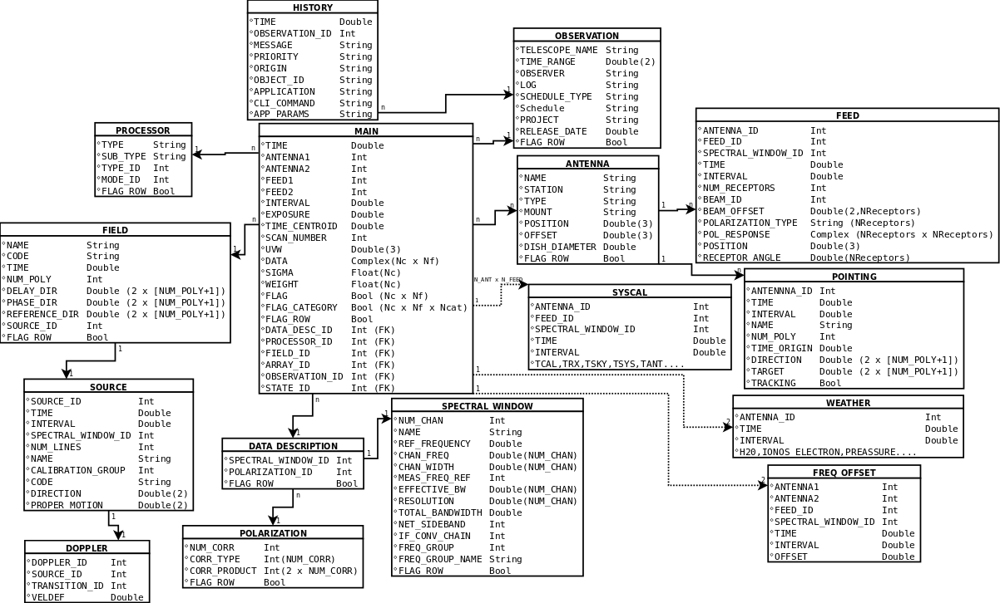

In [19]:
display(Image("https://raw.githubusercontent.com/bennahugo/UCT-MSc-thesis/master/Thesis/images/ms_relations.png"))

# Reading in the data

We will use a new Python library called xarray-ms to read in the radio data. Even though we have given you data for only 16 of the 64 antennas, the observation is still about 60GB! This is because radio data for N antennas will contain $N_\text{bl}=\frac{N(N-1)}{2} + N$ unique antenna pairs and means there are $N_\text{bl}$ rows for every integration timestep. 

It is necessary to carve up the observation into smaller chunks for processing. This also gives us a way to parallelize the compute - multiple small chunks can can be processed in parallel (i.e. "data parallelism"). Luckily the library carves up the data for you automatically!

For debugging purposes we have also given you a subset of the data containing only 5 antennas and less than half the scans. Play around with the small dataset first before you move onto the larger dataset.

One of the ways to schedule operations on DASK is to set up a data flow graph of operations. The interface is nearly identical to that of a numpy-based workflow. However, the individual operations are lazily chained together and only executed once you call ".compute()" on the final array. 

In the background the DASK scheduler executes bits of the resulting dataflow graph that are disjoint in parallel and provides you the opportunity to potentially scale your application over a distributed architecture by simply swapping out schedulers! See how this works below. Here we compute an average amplitude per channel for each scan for plotting purposes. We start by splitting the data into scans and fields then chunking up each of these scans further and then  computing the average and standard deviation over all these subchunks.

The combined compute graph is visualized below.

In [20]:
MS = "1491291289.calibrators.ms" # large dataset -> 60GiB+
MS = "1491291289.calibrators.small.ms"

# Set up a mapping between metadata tables and labels
table_name = {short: "::".join((MS, full)) for short, full
                  in [('antenna', "ANTENNA"),
                      ('ddid', "DATA_DESCRIPTION"),
                      ('spw', "SPECTRAL_WINDOW"),
                      ('pol', "POLARIZATION"),
                      ('field', "FIELD")]}

In [21]:
def timeit(method):
    """ Decorator timing method from 
        https://medium.com/pythonhive/python-decorator-to-measure-the-execution-time-of-methods-fa04cb6bb36d
    """
    def timed(*args, **kw):
        ts = time.time()
        result = method(*args, **kw)
        te = time.time()

        if 'log_time' in kw:
            name = kw.get('log_name', method.__name__.upper())
            kw['log_time'][name] = int((te - ts) * 1000)
        else:
            print '%r  %2.2f ms' % \
                  (method.__name__, (te - ts) * 1000)
        return result

    return timed

In [26]:
@timeit
def create_waterfall():
    datasets = xms.xds_from_ms(MS,
                               group_cols=("DATA_DESC_ID"),
                               chunks={'row': 1000})
    ds = list(datasets)[0] # only one DDID
    unique_fields = dask.array.unique(ds["FIELD_ID"].data).compute()
    lin_scan = dask.array.arange(dask.array.min(ds["SCAN_NUMBER"].data),
                                 dask.array.max(ds["SCAN_NUMBER"].data), chunks={'row': 1000}).compute()
    swnd = xms.xds_from_table(table_name["spw"])
    chan_freqs = list(swnd)[0]["CHAN_FREQ"].data.ravel().compute()
    
    # initialize an empty holder for waterfall plots per field and scan
    scan_avgs = xarr.Dataset({"avgs": (("fieldid", "scanid", "freq", "pol"), 
                                       np.zeros((unique_fields.size, lin_scan.size, chan_freqs.size, 4), dtype=np.float32))},
                             {"fieldid": unique_fields, "scanid": lin_scan, "freq": chan_freqs, "pol": ["XX", "XY", "YX", "YY"]})
    
    # partition by field and scan
    datasets = list(xms.xds_from_ms(MS,
                                    group_cols=("FIELD_ID", "SCAN_NUMBER"),
                                    index_cols="TIME",
                                    chunks={'row': 1000}))
    mean_ops = []    
        
    for subset in datasets:
        m = dask.array.nanmean(dask.array.absolute(subset.DATA.data).real, axis=0)
        mean_ops.append(m)
        
    

    comp_graph = dask.visualize(*mean_ops, filename="waterfall_compute.svg")
    mean_ops = dask.compute(*mean_ops)

    for subset, m in zip(datasets, mean_ops):
        scan_avgs.avgs[scan_avgs.fieldid == subset.attrs["FIELD_ID"],
                      scan_avgs.scanid == subset.attrs["SCAN_NUMBER"]] = m    

    return scan_avgs, comp_graph

avgs, graph = create_waterfall()


Successful readonly open of default-locked table 1491291289.calibrators.small.ms: 24 columns, 53365 rows
Successful readonly open of default-locked table 1491291289.calibrators.small.ms::SPECTRAL_WINDOW: 14 columns, 1 rows
Successful readonly open of default-locked table 1491291289.calibrators.small.ms: 24 columns, 53365 rows
'create_waterfall'  13263.93 ms


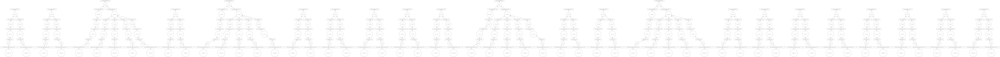

In [27]:
### to view the graph associated with this uncomment:
display(graph)

# Plotting it up!
With the averages in hand we can create a plot. Bokeh is a new library that creates interactive javascript-based plots that is embedded into the HTML. This means that once the plots are created you can download the notebook as html and continue to interact with the plots without running python or access to the original data.

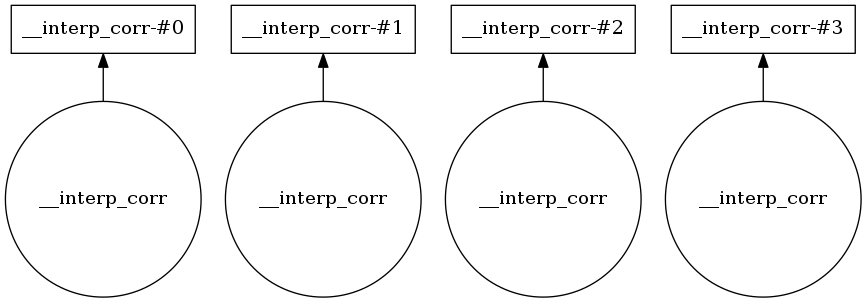

In [32]:
def plot_waterfall(scan_freq_avgs, height_px=800, width_px=800, field_no=2):
    # get the data to be plotted and the axes
    x = scan_freq_avgs.freq.data / 1.0e6
    y = scan_freq_avgs.scanid.data
    
    # we can even put custom python functions into a graph to be executed in parallel
    # here we just have 4 very simple graphs, but this can be linked into an arbitrarily complex
    # graph
    def __interp_corr(corr_no):
        seldata = scan_freq_avgs.avgs[field_no, :, :, corr_no]
        image = seldata.data
        

        # snap to meshgrid of user-specified size
        xx, yy = np.meshgrid(np.linspace(np.min(x), np.max(x), width_px),
                             np.linspace(np.min(y), np.max(y), height_px))
        return NearestNDInterpolator((np.tile(x, [1, y.size]).flatten(),
                                                np.repeat(y, x.size)),
                                                image.flatten())(xx, yy)
    network = [dask.delayed(__interp_corr)(corr_no) for corr_no in range(4)]
    display(dask.visualize(*network))
    interp_im = dask.compute(*network)
    interp_im = bpl_models.ColumnDataSource(dict(zip(["XX","XY","YX","YY"], 
                                                     interp_im)))
    
    #draw figure
    p = bpl.figure(plot_width=width_px,
                   plot_height=height_px,
                   x_range=(0, width_px),
                   y_range=(0, height_px),
                   tools="pan,wheel_zoom,box_zoom,reset"
                  )
    color_mapper = bpl_models.LinearColorMapper(palette=bpl_palettes.Inferno256, 
                                                low=0, high=400)

    waterfall = p.image(image=[interp_im.data["XX"]], x=0, y=0, 
                        dw=width_px, dh=height_px, color_mapper=color_mapper) # selection in 'image'
    
    color_bar = bpl_models.ColorBar(color_mapper=color_mapper,
                                    label_standoff=12, border_line_color=None, 
                                    location=(0,0))
    p.add_layout(color_bar, 'right')
    p.xaxis.axis_label = "Frequency (MHz)"
    p.yaxis.axis_label = "Scan number"
    def _linear_format(nval, minval, maxval):
        return bpl_models.FuncTickFormatter(code=
            "return Math.floor(tick / %.2f * (%d - %d) + %d); " % 
            (nval, maxval, minval, minval))
    p.xaxis.formatter = _linear_format(width_px, np.min(x), np.max(x))
    p.yaxis.formatter = _linear_format(height_px, np.min(y), np.max(y))
    
    
    #register controllers
    on_corr_select = bpl_models.CustomJS(args={"target": waterfall,
                                               "model": interp_im},
                                         code="""
                                                var column = cb_obj.value;
                                                target.data_source.data.image[0].set(model.data[column]);
                                                console.debug(target);
                                                target.data_source.change.emit();
                                              """)
    sel_corr = bpl_models.widgets.Select(title="Correlation:",
                                         value="XX",
                                         options=sorted(interp_im.data.keys()),
                                         callback=on_corr_select
                                         )
    on_eq_adjust = bpl_models.CustomJS(args={"target": waterfall},
                                         code="""
                                                var vmax = cb_obj.value;
                                                target.glyph.color_mapper.high = vmax;
                                                target.glyph.color_mapper.change.emit();
                                              """)
    sld_vmax = bpl_models.widgets.Slider(start=0.0, 
                                         end=400, 
                                         value=400, 
                                         step=.1, 
                                         title="Equalization max",
                                         callback=on_eq_adjust)
    box_controls = bpl_models.layouts.Row(sel_corr, sld_vmax)
    layout = bpl_models.layouts.Column(p, box_controls)
    bpl.show(layout)
plot_waterfall(avgs, field_no=2)

Now it is up to you! Expand the tools and try draw correlations between RFI and the properties of the array. How does RFI depend on the physical size of the telescope? Is there any RFI that is highly temporal?

After inspection discuss possible mitigation algorithms with your group and try create a basic parallel implementation. Time it and play around with chunking strategies to see how this impacts the performance.